In [12]:
suppressPackageStartupMessages({
    library(SingleCellExperiment)
    library(data.table)
    library(Matrix)
    library(dplyr)
})

In [2]:
out_dir = '/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/Erythroid/'

In [3]:
# load cao
cao_in = '/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/schendure/'

counts = readMM(paste0(cao_in, 'raw_counts.mtx')) # readMM for .mtx input
genes = read.csv(paste0(cao_in, 'genes.csv'))[[1]]
cells = read.csv(paste0(cao_in, 'cells.csv'))[[1]]

colnames(counts) = cells
rownames(counts) = genes

cao_meta = fread(paste0(cao_in, 'cell_annotate.csv')) %>% 
    .[sample %in% colnames(counts),] %>%
    .[order(match(sample, colnames(counts)))] %>%
    .[,c('cell', 'stage', 'development_stage', 'exp', 'sample'):= list(sample, paste0('E', development_stage), NULL, 'cao', paste0('cao_', sapply(strsplit(sapply(strsplit(sample,"-"), `[`, 3),"[.]"), `[`, 1)))] %>%
    .[,c('cell', 'sample', 'stage', 'Sub_trajectory_name', 'exp')] %>% 
    setnames('Sub_trajectory_name', 'celltype') %>% 
    tibble::column_to_rownames("cell") %>% DataFrame

stopifnot(colnames(counts) == rownames(cao_meta))

cao_sce = SingleCellExperiment(assays = list("counts" = counts), 
                               colData = cao_meta )
cao_sce = cao_sce[Matrix::rowSums(counts(cao_sce)) > 0,]

In [4]:
# load extended atlas
atlas_in = '/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/extended/'
ext_sce = readRDS(paste0(atlas_in, 'processed/SingleCellExperiment.rds'))

keep = c('Blood progenitors',
            'Haematoendothelial progenitors', 
            'Embryo proper endothelium',
            'Allantois endothelium',
            'Erythroid',
            'YS endothelium',
            'Venous endothelium',
            'EMP',
            'MEP',
            'Megakaryocyte progenitors', 
            'Chorioallantoic-derived erythroid progenitors',
            'YS mesothelium-derived endothelial progenitors'
        )
ext_meta =  fread(paste0(atlas_in, 'sample_metadata.txt.gz')) %>%
    .[celltype %in% keep] %>% .[,c('cell', 'sample', 'stage', 'celltype')] %>%
    .[,c('cell', 'sample', 'exp'):= list(paste0('ext_', cell), paste0('ext_', sample), sapply(strsplit(cell, '_'), `[`, 1))]
ext_meta[exp=='cell']$exp = 'blanca'

colnames(ext_sce) = paste0('ext_', colnames(ext_sce))
ext_sce = ext_sce[,ext_meta$cell]

colData(ext_sce) = ext_meta %>% tibble::column_to_rownames("cell") %>% DataFrame

ext_sce = ext_sce[Matrix::rowSums(counts(ext_sce)) > 0,]

gene_names = fread(paste0(atlas_in, 'genes_name.tsv'))
gene_names = gene_names[ensembl_gene_id %in% rownames(ext_sce)] %>% 
    .[order(match(ensembl_gene_id, rownames(ext_sce))),] 
gene_names[is.na(external_gene_name)]$external_gene_name = gene_names[is.na(external_gene_name)]$ensembl_gene_id

rownames(ext_sce) = gene_names$external_gene_name


# Create atlas

In [5]:
ext_sce
cao_sce

class: SingleCellExperiment 
dim: 19608 14728 
metadata(0):
assays(1): counts
rownames(19608): Cnnm3 Lman2l ... 2610016A17Rik Cc2d2b
rowData names(0):
colnames(14728): ext_cell_52223 ext_cell_761 ... ext_ext_cell_330066
  ext_ext_cell_329864
colData names(4): sample stage celltype exp
reducedDimNames(0):
mainExpName: NULL
altExpNames(0):

class: SingleCellExperiment 
dim: 17094 25000 
metadata(0):
assays(1): counts
rownames(17094): Xkr4 Rp1 ... mt-Nd6 mt-Cytb
rowData names(0):
colnames(25000): sci3-me-409.GTATCGCATCCGCTCCGGC
  sci3-me-459.GTCGGAGTTTAGACTTCTT ... sci3-me-454.ATAAGCGAATTCGGCCTTAC
  sci3-me-111.TTCAACTGATGGTATCCGCC
colData names(4): sample stage celltype exp
reducedDimNames(0):
mainExpName: NULL
altExpNames(0):

In [6]:
# genes shared across datasets
shared_genes = intersect(rownames(ext_sce), rownames(cao_sce))

# filter genes chimera dataset
cao_sce = cao_sce[shared_genes,]

# filtergenes atlas dataset
ext_sce = ext_sce[shared_genes,]


In [7]:
atlas_sce = cbind(ext_sce, cao_sce)

In [8]:
sceasy::convertFormat(atlas_sce, from="sce", 
                      to="anndata",
                      outFile='/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/Erythroid/processed/anndata.h5ad')

AnnData object with n_obs × n_vars = 39728 × 15483
    obs: 'sample', 'stage', 'celltype', 'exp'
    var: 'name'

In [9]:
saveRDS(atlas_sce, '/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/Erythroid/processed/SingleCellExperiment.rds')

# Analysis no batch correction

In [13]:
library(scran)
library(scater)

Loading required package: ggplot2



In [4]:
atlas_sce = readRDS('/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/Erythroid/processed/SingleCellExperiment.rds')

In [5]:
# atlas_sce = atlas_sce_bu
# atlas_sce = atlas_sce[,colData(atlas_sce)$exp == 'extended']
#colData(atlas_sce)$batch = sapply(strsplit(rownames(colData(atlas_sce)),"_"), `[`, 2)

In [6]:
atlas_sce <- computeSumFactors(atlas_sce)
atlas_sce <- logNormCounts(atlas_sce)

Warning message in (function (x, sizes, min.mean = NULL, positive = FALSE, scaling = NULL) :
“encountered non-positive size factor estimates”


In [7]:
decomp <- modelGeneVar(atlas_sce, block=colData(atlas_sce)$exp)
decomp <- decomp[decomp$mean > 0.01,]
hvgs <- decomp[order(decomp$FDR),] %>% head(n=2500) %>% rownames

In [8]:
sce_filt <- atlas_sce[hvgs,]

In [9]:
library(batchelor)

In [35]:
pca <- multiBatchPCA(sce_filt, batch = colData(atlas_sce)$stage, d = 20)
pca.corrected <- reducedMNN(pca)$corrected
colnames(pca.corrected) <- paste0("PC",1:ncol(pca.corrected))
reducedDim(sce_filt, "PCA") <- pca.corrected
sce_filt <- runUMAP(sce_filt, dimred="PCA", n_neighbors = 35, min_dist = 0.5)

Warning message in .refine_k(k, precomputed, query = TRUE):
“'k' capped at the number of observations”
Warning message in .check_reddim_names(x, value, withDimnames):
“non-NULL 'rownames(value)' should be the same as 'colnames(x)' for
'reducedDim<-'. This will be an error in the next release of
Bioconductor.”


In [36]:
# sce_filt <- runPCA(sce_filt, ncomponents = 20, ntop=2500)  
# sce_filt <- runUMAP(sce_filt, dimred="PCA", n_neighbors = 35, min_dist = 0.5)

In [37]:
options(repr.plot.width=15, repr.plot.height=6)

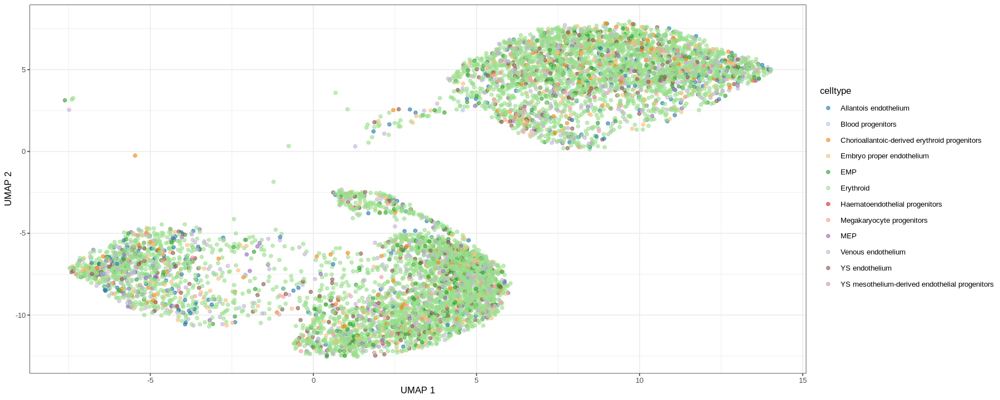

In [41]:
plotReducedDim(sce_filt[,colData(sce_filt)$exp%in%c('ext', 'Blanca'),], dimred = "UMAP", colour_by="celltype")


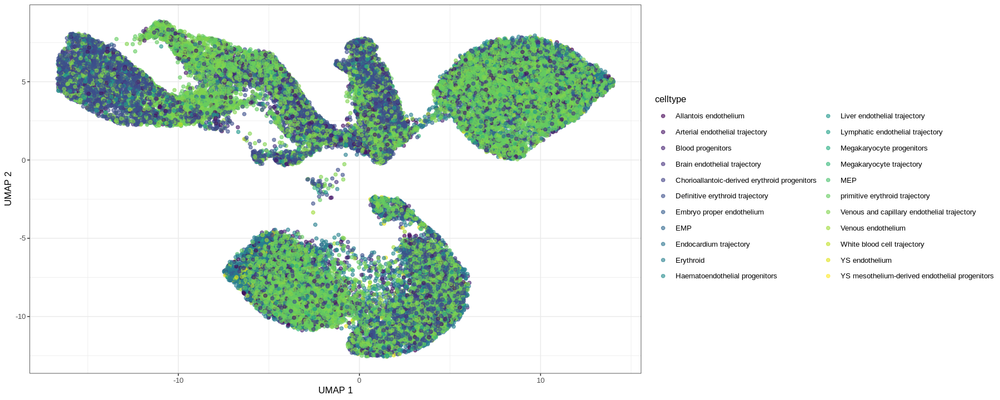

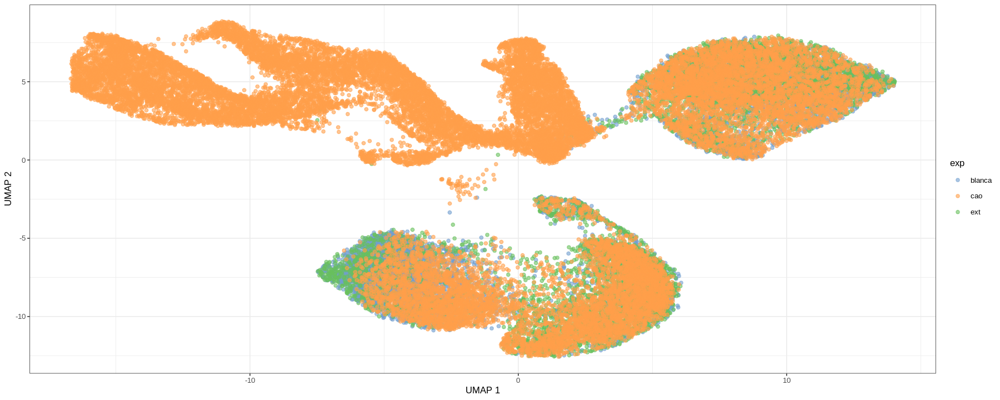

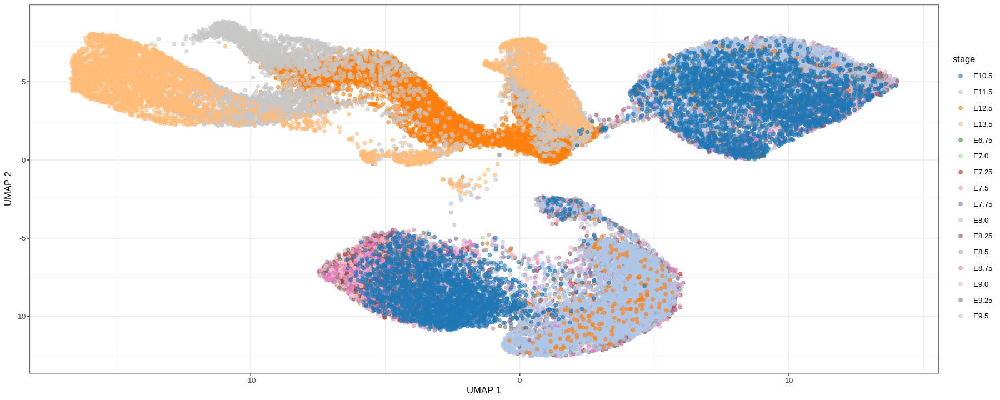

In [39]:
plotReducedDim(sce_filt, dimred = "UMAP", colour_by="celltype")
plotReducedDim(sce_filt, dimred = "UMAP", colour_by="exp")
plotReducedDim(sce_filt, dimred = "UMAP", colour_by="stage")

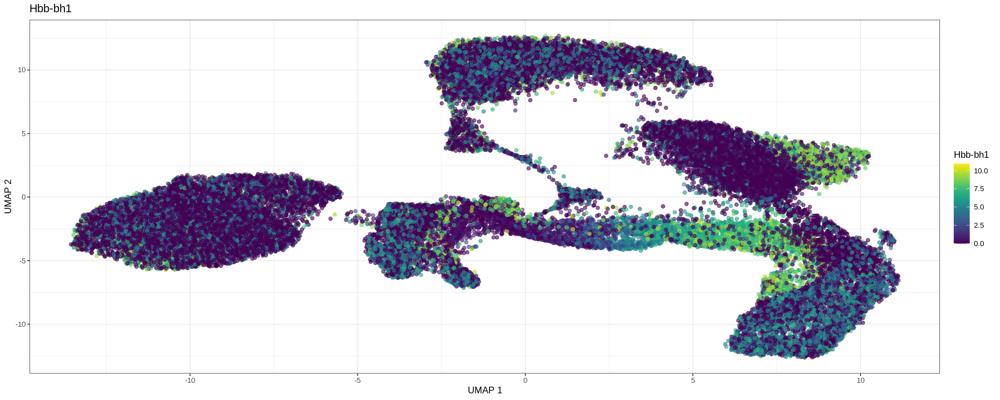

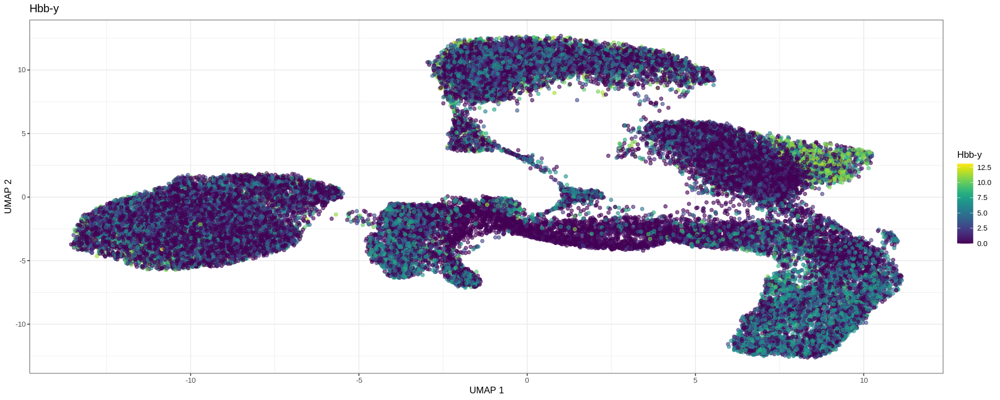

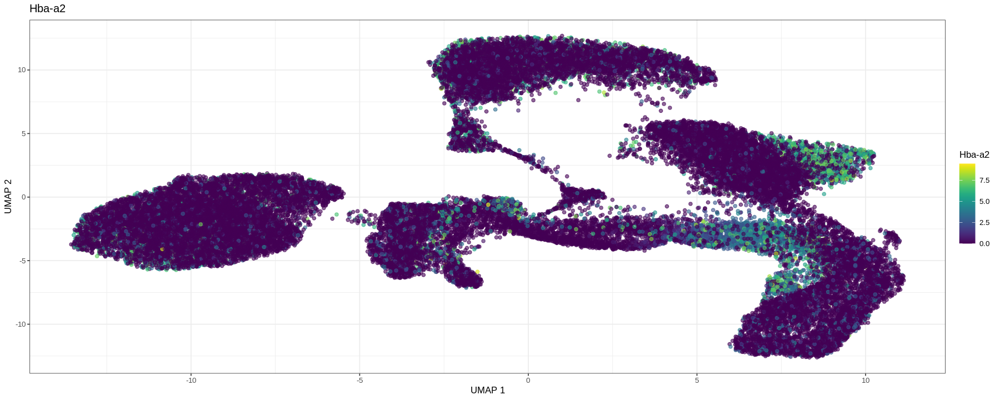

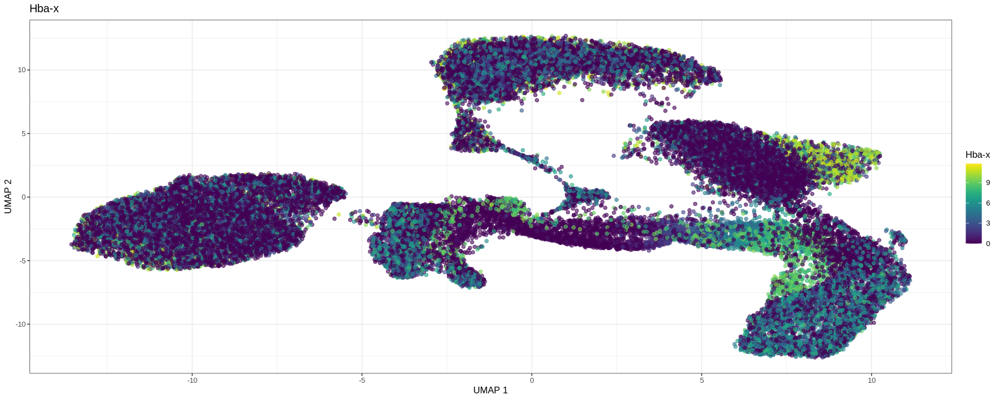

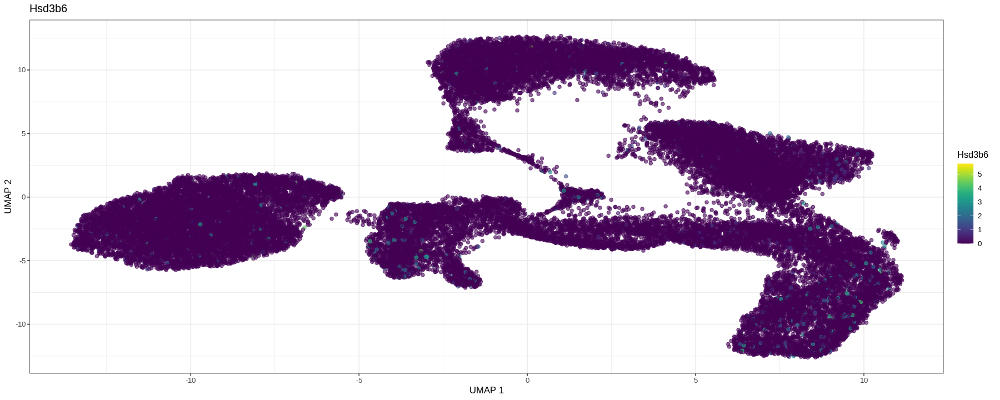

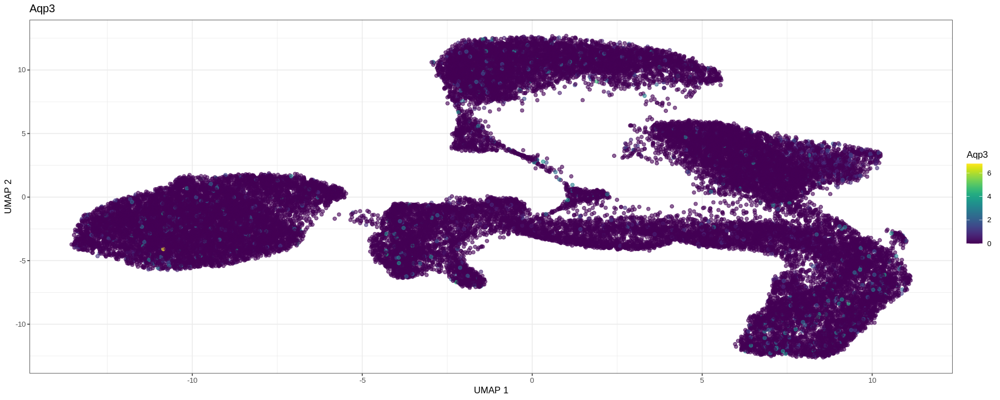

In [27]:
genes = c('Hbb-bh1','Hbb-y',  'Hba-a2', 'Hba-x', 'Hsd3b6', 'Aqp3')
for(i in genes){
p = plotReducedDim(sce_filt, dimred = "UMAP", colour_by=i, by_exprs_values = "logcounts") + ggtitle(i)
print(p)}

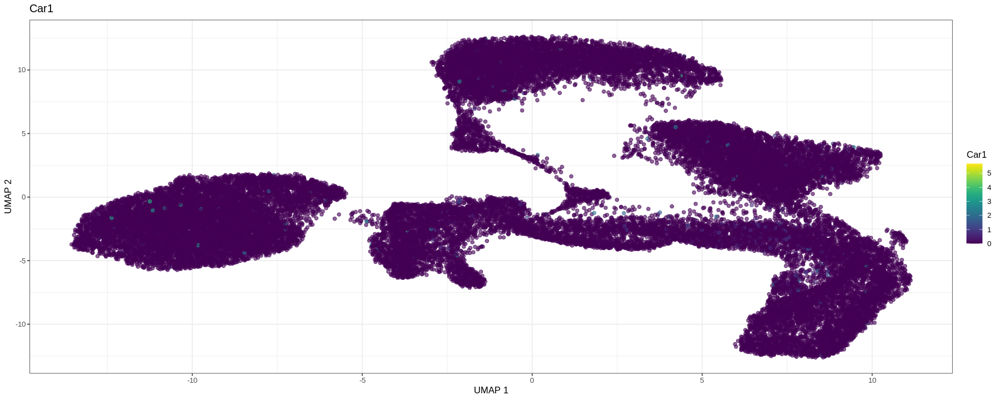

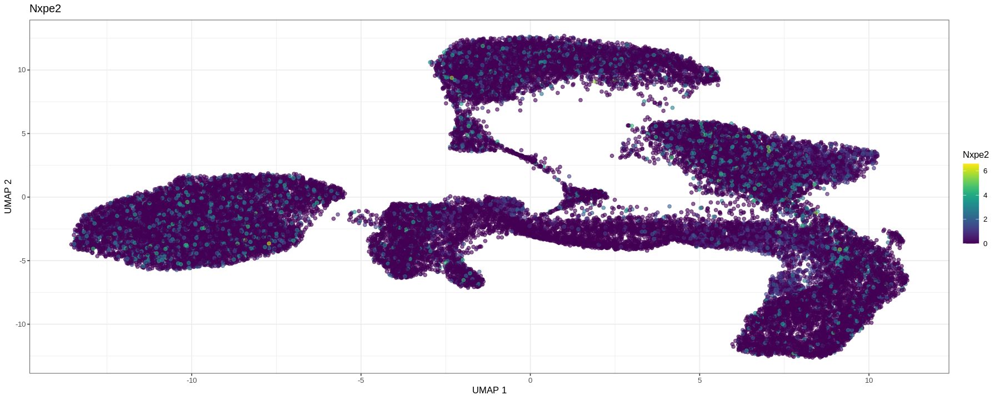

In [28]:
genes = c('Car1','Nxpe2')
for(i in genes){
p = plotReducedDim(sce_filt, dimred = "UMAP", colour_by=i, by_exprs_values = "logcounts") + ggtitle(i)
print(p)}

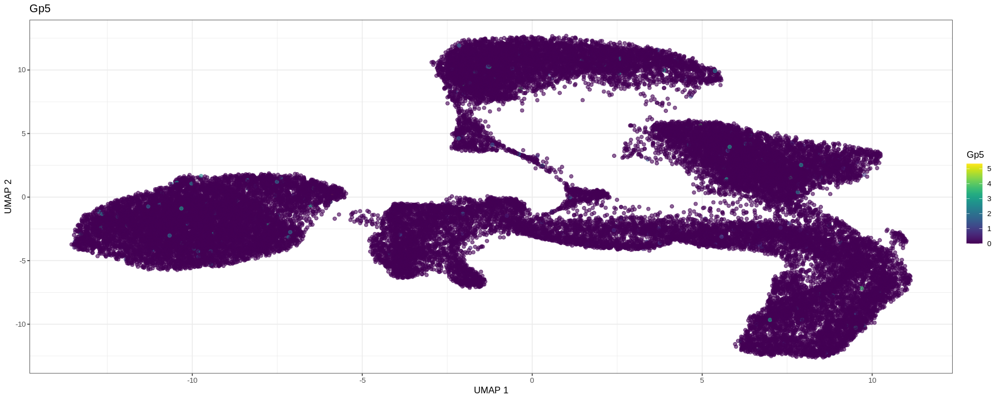

In [29]:
genes = c( 'Gp5')
for(i in genes){
p = plotReducedDim(sce_filt, dimred = "UMAP", colour_by=i, by_exprs_values = "logcounts") + ggtitle(i)
print(p)}

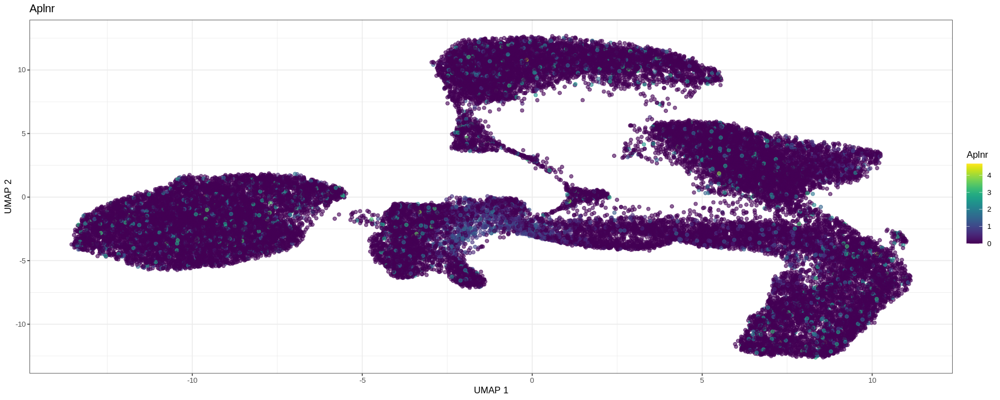

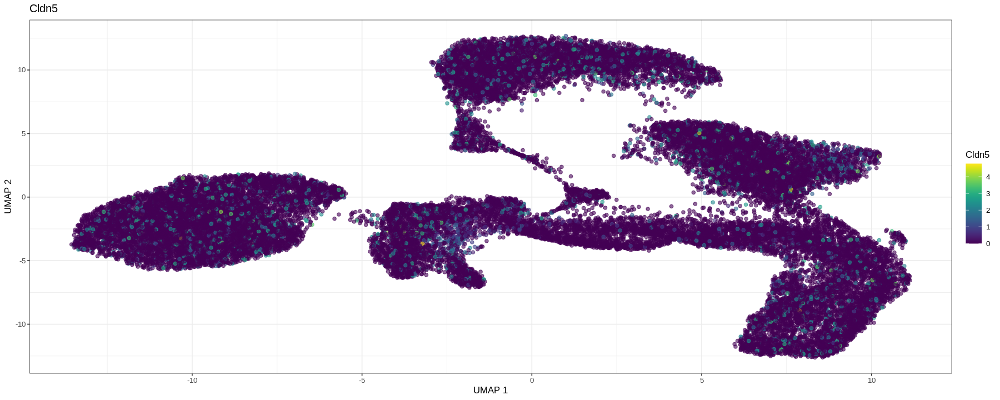

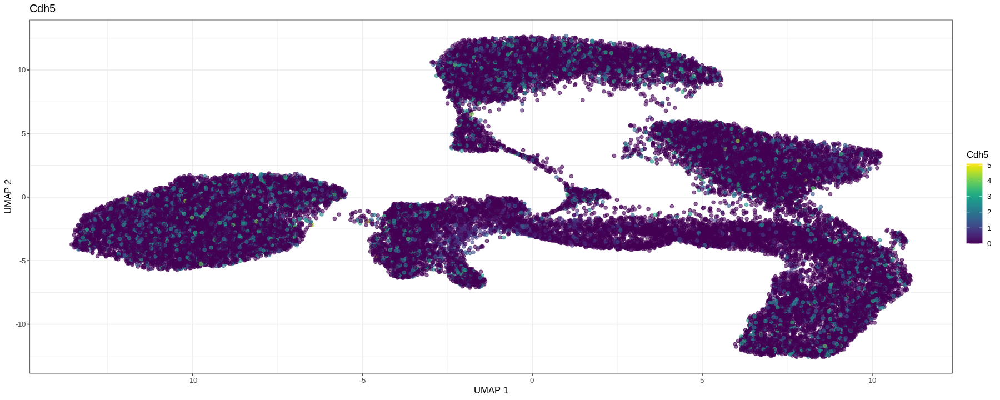

In [30]:
genes = c('Aplnr', 'Cldn5', 'Cdh5')
for(i in genes){
p = plotReducedDim(sce_filt, dimred = "UMAP", colour_by=i, by_exprs_values = "logcounts") + ggtitle(i)
print(p)}

In [214]:
atlas_sce = readRDS('/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/Erythroid/processed/SingleCellExperiment.rds')
atlas_sce = atlas_sce[,colData(atlas_sce)$exp == 'cao']

In [202]:
main = '/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/schendure/'
meta = fread(paste0(main, 'cell_annotate.csv'))

In [223]:
meta_atlas = as.data.table(colData(atlas_sce), keep.rownames=TRUE)[,c('rn', 'stage', 'celltype')] %>% setnames('rn', 'sample')

Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”


In [226]:
test = merge(meta_atlas, meta, by= 'sample')

In [264]:
# load cao
cao_in = '/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/schendure/'

counts = readMM(paste0(cao_in, 'raw_counts.mtx')) # readMM for .mtx input
genes = read.csv(paste0(cao_in, 'genes.csv'))[[1]]
cells = read.csv(paste0(cao_in, 'cells.csv'))[[1]]

colnames(counts) = cells
rownames(counts) = genes

cao_meta = read.table(paste0(cao_in, 'meta.csv'), header = TRUE, sep = ",", stringsAsFactors = FALSE, comment.char = "$")

cao_sce = SingleCellExperiment(assays = list("counts" = counts))
cao_sce = cao_sce[Matrix::rowSums(counts(cao_sce)) > 0,]

cao_meta$cell = cao_meta$sample
cao_meta$stage = paste0('E', cao_meta$development_stage)
cao_meta$development_stage = NULL
cao_meta$sample = sapply(strsplit(cao_meta$sample,"-"), `[`, 3)
cao_meta$sample = sapply(strsplit(cao_meta$sample,"[.]"), `[`, 1)
cao_meta$sample = paste0('cao_', cao_meta$sample)
cao_meta$exp = 'cao'

cao_meta = cao_meta %>% select(cell, sample, stage, Main_cell_type, exp)
colnames(cao_meta) = c('cell', 'sample', 'stage', 'celltype', 'exp')
colData(cao_sce) = cao_meta %>% tibble::column_to_rownames("cell") %>% DataFrame

In [265]:
atlas_sce = cao_sce

In [266]:
atlas_sce <- computeSumFactors(atlas_sce)
atlas_sce <- logNormCounts(atlas_sce)

In [267]:
decomp <- modelGeneVar(atlas_sce, block=colData(atlas_sce)$stage)
decomp <- decomp[decomp$mean > 0.01,]
hvgs <- decomp[order(decomp$FDR),] %>% head(n=2500) %>% rownames

In [268]:
sce_filt <- atlas_sce[hvgs,]

In [269]:
library(batchelor)

In [270]:
pca <- multiBatchPCA(sce_filt, batch = colData(atlas_sce)$stage, d = 20)
pca.corrected <- reducedMNN(pca)$corrected
colnames(pca.corrected) <- paste0("PC",1:ncol(pca.corrected))
reducedDim(sce_filt, "PCA") <- pca.corrected

sce_filt <- runUMAP(sce_filt, dimred="PCA", n_neighbors = 35, min_dist = 0.5)

Warning message in .check_reddim_names(x, value, withDimnames):
“non-NULL 'rownames(value)' should be the same as 'colnames(x)' for
'reducedDim<-'. This will be an error in the next release of
Bioconductor.”


In [271]:
#sce_filt <- runPCA(sce_filt, ncomponents = 20, ntop=2500)  
#sce_filt <- runUMAP(sce_filt, dimred="PCA", n_neighbors = 35, min_dist = 0.5)

In [272]:
options(repr.plot.width=15, repr.plot.height=6)

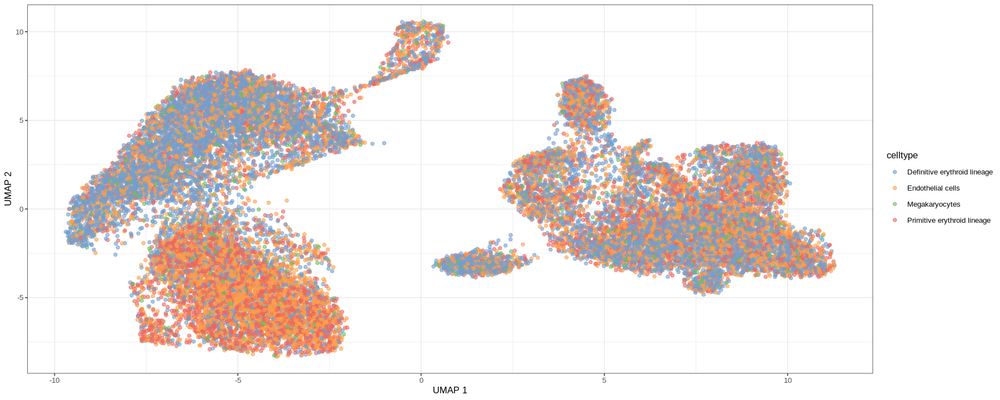

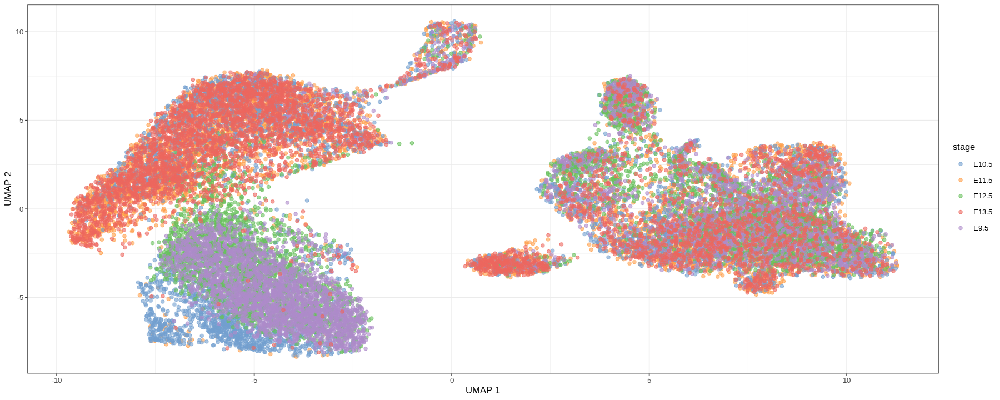

In [274]:
plotReducedDim(sce_filt, dimred = "UMAP", colour_by="celltype")
#plotReducedDim(sce_filt, dimred = "UMAP", colour_by="batch")
plotReducedDim(sce_filt, dimred = "UMAP", colour_by="stage")